In [ ]:
%load_ext autoreload
%autoreload 2

from common import DUMMY, DATA_DIR
import utils as utl
import graphics as grph
import feature_engineering as feat
import models

import numpy as np
import pandas as pd

import itertools
from warnings import simplefilter 
simplefilter(action="ignore", category=pd.errors.PerformanceWarning)

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline

#### Here are all my picked events as of 29/10/2024:
- CANDAS1 GC/2020-08-15_19h05m
- CANDAS1 TF 20200822_1713
- CANDAS1 GC 20200822_1713
- CASTOR 2023-07-20
- CANDAS1 T 20200727_2044
- CANDAS1 T 20200727_1305
- CASTOR 2023-06-01
- SAFE 2023-11-13

To be predicted on:
- CANDAS2_2022-11-17_04-38-20
- CANDAS2_2022-12-27_07-46-15   *picked also
- CANDAS2_2023-04-16_12-22-36
- CANDAS2_2023-04-11_11-09-04
- CANDAS2_2023-02-22_07-01-14
- CANDAS2_2023-01-07_10-48-10

#### Load CANDAS event and picks

In [3]:
candas1_df = utl.import_miniseed('/home/tatiana/Documents/Onboarding_to_TREMORS/CANDAS/GC/20200815_19h05m/eventCANDAS/', 2020, 'G')

Reading traces elapsed time:  0:00:07.38


In [4]:
candas1_df = utl.filter_imported_data(candas1_df, pass_low=3, pass_hi=12.5, decimate_data=True)

In [5]:
candas1_df = utl.set_data_limits(candas1_df, first_ch=415, first_time=13000, last_time=18000)

In [ ]:
candas1_bad_channels = utl.load_bad_channels(candas1=True)

#### Load CANDAS2 event

In [3]:
candas2_df = utl.import_h5('/home/tatiana/Documents/Onboarding_to_TREMORS/CANDAS2/CANDAS2_2022-12-27_07-46-15.h5')

In [4]:
candas2_df = utl.filter_imported_data(candas2_df, pass_low=3, pass_hi=12.5, decimate_data=True)

In [5]:
candas2_df.shape

(8000, 7007)

In [6]:
candas2_df = utl.set_data_limits(candas2_df, first_ch=415, first_time=3000, last_time=6000)

In [ ]:
candas2_bad_channels = utl.load_bad_channels('channel_selections/quality_picks_candas2_picked_0730_1940.csv', 415)

#### Load SAFE event

In [19]:
safe_t_df = utl.import_h5('data/SAFE/ICM_2023-11-13_14-57-38.h5')

In [21]:
utl.get_h5_attributes('data/SAFE/ICM_2023-11-13_14-57-38.h5')

start time = 2023-11-13T14:57:38.699345
sampling rate = 100.0
spatial resolution = 10.0


In [22]:
safe_t_df = utl.filter_imported_data(safe_t_df, freq=100, decimate_data=True)

In [23]:
safe_t_df = utl.set_data_limits(safe_t_df, first_ch=236, first_time=3000, last_time=6500)

In [ ]:
safe_bad_channels = utl.load_bad_channels('channel_selections/CQI_selections_SAFE_2023-11-13_14-57-38_picked_1021_2043.csv', 236)

#### Load second CASTOR event

In [27]:
castor2_df = utl.import_h5("data/CASTOR/z12023_06_01_06h48m33s_318.h5")
castor2_df = utl.filter_imported_data(castor2_df, pass_low=3, pass_hi=12.5, decimate_data=True, freq=100)
castor2_df.shape

(12100, 3487)

In [28]:
castor2_df = utl.set_data_limits(castor2_df, first_ch=1082, first_time=2500, last_time=4000)

In [ ]:
castor2_bad_channels = utl.load_bad_channels('channel_selections/CQI_selections_CASTOR_2023_06_01_picked_1004_1611.csv', 1082)

#### Load twin event (GC)

In [32]:
twin_gc_df = utl.import_h5('data/toTatiana/events_CANDAS_TF&GC/ZI.G20200822_1713.h5')

In [33]:
twin_gc_df = utl.filter_imported_data(twin_gc_df,decimate_data=True)

In [34]:
twin_gc_df.shape

(8951, 6084)

In [35]:
twin_gc_df = utl.set_data_limits(twin_gc_df, first_ch=415, last_time=3000)

In [ ]:
twin_gc_bad_channels = utl.load_bad_channels('channel_selections/quality_picks_gc_twin_event_G20200822_1713_picked_0802_1839.csv', 415)

#### Load twin event (TF)

In [39]:
twin_tf_df = utl.import_h5('data/toTatiana/events_CANDAS_TF&GC/ZI.T20200822_1713.h5')

In [40]:
twin_tf_df = utl.filter_imported_data(twin_tf_df,decimate_data=True)

In [41]:
twin_tf_df.shape

(8951, 5984)

In [42]:
twin_tf_df = utl.set_data_limits(twin_tf_df, first_ch=745, first_time=4000, last_time=6000)

In [ ]:
twin_tf_bad_channels = utl.load_bad_channels('channel_selections/quality_picks_tf_twin_event_T20200822_1713_picked_0807_0337.csv', 745)

#### Load event picked July 17th, just one of a twin

In [46]:
tf_2nd_pick = utl.import_h5("/home/tatiana/Documents/Onboarding_to_TREMORS/CQI/data/CANDAS/TF/ZI.T20200727_2044.h5")

In [47]:
tf_2nd_pick = utl.filter_imported_data(tf_2nd_pick, decimate_data=True)

In [48]:
tf_2nd_pick.shape

(8951, 5984)

In [49]:
tf_2nd_pick = utl.set_data_limits(tf_2nd_pick, first_ch=745, first_time=4000)

In [ ]:
tf_2nd_pick_bad_channels = utl.load_bad_channels('channel_selections/CQI_selections_T20200727_2044_picked_0912_1800.csv', 745)

#### Load Tenerife event same day but earlier

In [54]:
tf_same_day = utl.import_h5("/home/tatiana/Documents/Onboarding_to_TREMORS/CQI/data/CANDAS/TF/ZI.T20200727_1305.h5")

In [55]:
tf_same_day = utl.filter_imported_data(tf_same_day, decimate_data=True)

In [56]:
tf_same_day.shape

(8951, 5984)

In [57]:
tf_same_day = utl.set_data_limits(tf_same_day, first_ch=745, first_time=4500, last_time=7500)

In [ ]:
tf_same_day_bad_channels = utl.load_bad_channels('channel_selections/CQI_selections_T20200727_1305_picked_0918_1813.csv', 745)

#### Load CASTOR 07/20 event (Specifically 115624!!)

In [65]:
castor_df = utl.import_h5("data/CASTOR/20230720-115624.h5")

In [66]:
castor_df = utl.filter_imported_data(castor_df, pass_low=3, pass_hi=12.5, decimate_data=True, freq=100)

In [67]:
castor_df = utl.set_data_limits(castor_df, first_ch=1082, first_time=1800, last_time=2800)

In [ ]:
castor_bad_channels = utl.load_bad_channels('channel_selections/quality_picks_castor2_20230720_picked_0813_2235.csv', 1082)

#### Now: create the training set

In [72]:
%%time
df_features1 = feat.create_feature_df(candas1_df)

created normal features
created mfccs


/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=99
  warnings.warn(


created envelope mfccs
created psd
created psd of envelope
CPU times: user 13min 47s, sys: 20.1 s, total: 14min 8s
Wall time: 11min 29s


In [73]:
df_features1.shape

(5574, 131)

In [74]:
%%time
df_tf_2nd_pick_features = feat.create_feature_df(tf_2nd_pick)

created normal features
created mfccs


/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=98
  warnings.warn(


created envelope mfccs
created psd
created psd of envelope
CPU times: user 13min 24s, sys: 18.6 s, total: 13min 43s
Wall time: 11min 7s


In [75]:
%%time
df_tf_same_day_features = feat.create_feature_df(tf_same_day)

created normal features
created mfccs


/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=59
  warnings.warn(


created envelope mfccs
created psd
created psd of envelope
CPU times: user 8min 53s, sys: 17 s, total: 9min 10s
Wall time: 6min 39s


In [76]:
%%time
df_castor_features = feat.create_feature_df(castor_df)

created normal features


/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1001
  warnings.warn(


created mfccs


/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=19
  warnings.warn(


created envelope mfccs
created psd
created psd of envelope
CPU times: user 2min 17s, sys: 7.75 s, total: 2min 24s
Wall time: 1min 14s


In [77]:
%%time
df_castor2_features = feat.create_feature_df(castor2_df)

created normal features


/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1501
  warnings.warn(


created mfccs


/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=29
  warnings.warn(


created envelope mfccs
created psd
created psd of envelope
CPU times: user 2min 38s, sys: 7.22 s, total: 2min 45s
Wall time: 1min 40s


In [78]:
%%time
df_gc_features = feat.create_feature_df(twin_gc_df)

created normal features
created mfccs


/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=59
  warnings.warn(


created envelope mfccs
created psd
created psd of envelope
CPU times: user 8min 55s, sys: 15.7 s, total: 9min 10s
Wall time: 6min 42s


In [79]:
%%time
df_tf_features = feat.create_feature_df(twin_tf_df)

created normal features


/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=2001
  warnings.warn(


created mfccs


/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=39
  warnings.warn(


created envelope mfccs
created psd
created psd of envelope
CPU times: user 6min, sys: 13.4 s, total: 6min 14s
Wall time: 4min 7s


In [80]:
%%time
df_safe_features = feat.create_feature_df(safe_t_df)

created normal features
created mfccs


/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=69
  warnings.warn(


created envelope mfccs
created psd
created psd of envelope
CPU times: user 8min 42s, sys: 13.4 s, total: 8min 56s
Wall time: 6min 49s


In [81]:
#cat all trained features dfs
df_features = pd.concat([df_features1, df_tf_2nd_pick_features, df_gc_features, df_tf_features, df_castor_features, df_castor2_features, 
                         df_tf_same_day_features, df_safe_features], ignore_index=True)

In [82]:
df_features

,mean,median,variance,skew,kurtosis,rms,peak,crest-factor,Average-rectified-value,stdev,...,two_kurtoses,env_freq-avg,env_freq-median,env_freq-variance,env_freq-skew,env_freq-kurtosis,env-freq-entropy,env_freq-rms,env_freq-peak,env_freq-crest-factor
0,-0.000080,0.002451,0.084090,-0.073971,1.619698,0.289955,1.618318,5.581283,0.217089,0.289984,...,145.699309,0.004444,0.529982,7.538830,9.277126,89.954599,3.586519,2.890547,27.367662,9.467987
1,-0.000140,-0.002674,0.107983,-0.165753,1.784093,0.328575,2.093339,6.370965,0.248658,0.328608,...,162.685965,0.004243,0.492398,9.760269,9.370480,91.186956,3.559843,3.274168,31.192882,9.526965
2,-0.000209,0.003905,0.150191,0.004415,1.751138,0.387506,1.960338,5.058859,0.290193,0.387545,...,157.844970,0.011027,0.557346,13.599618,9.306797,90.138501,3.526537,3.851731,36.677104,9.522239
3,-0.000037,-0.002003,0.122199,0.002824,0.638824,0.349535,1.415443,4.049499,0.271597,0.349570,...,61.138222,0.005806,0.448164,11.427121,9.704172,95.704308,3.326437,3.483132,33.928550,9.740817
4,-0.000325,-0.000178,0.118426,0.034782,1.659466,0.344097,2.016874,5.861351,0.261295,0.344131,...,155.131524,0.005138,0.529592,10.808124,9.540194,93.482814,3.544808,3.430177,32.966725,9.610793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37030,-0.001368,0.009726,10.969246,-0.226201,2.588071,3.311513,24.024658,7.254890,2.484550,3.311985,...,171.344703,0.077520,5.166786,695.150407,8.057231,66.205553,3.161129,27.585115,222.422766,8.063144
37031,-0.003269,0.039620,4.200260,-0.164345,0.800659,2.049163,10.299633,5.026263,1.579717,2.049453,...,53.773800,0.053492,1.882774,273.720859,8.144176,67.161922,2.791871,16.986802,138.901312,8.177014
37032,-0.001800,-0.017387,10.142042,0.039702,0.795640,3.184203,15.392997,4.834176,2.459402,3.184657,...,53.860765,0.082936,2.882261,665.338888,8.191297,67.694934,2.718126,26.397146,216.607039,8.205699
37033,-0.002839,-0.004020,4.972925,-0.154863,0.694603,2.229689,11.754479,5.271802,1.743252,2.230006,...,46.931767,0.073098,1.746226,326.700168,8.180337,67.566288,2.683038,18.482856,151.656823,8.205270


In [83]:
np.isnan(df_features).values.sum() 

0

In [84]:
np.isinf(df_features).values.sum() 

0

In [85]:
target1 = ~df_features1.index.isin(candas1_bad_channels)*1
target2 = ~df_tf_2nd_pick_features.index.isin(tf_2nd_pick_bad_channels)*1
target3 = ~df_gc_features.index.isin(twin_gc_bad_channels)*1
target4 = ~df_tf_features.index.isin(twin_tf_bad_channels)*1
target5 = ~df_castor_features.index.isin(castor_bad_channels)*1
target6 = ~df_castor2_features.index.isin(castor2_bad_channels)*1
target7 = ~df_tf_same_day_features.index.isin(tf_same_day_bad_channels)*1
target8 = ~df_safe_features.index.isin(safe_bad_channels)*1

In [86]:
df_features['target'] = pd.Series(itertools.chain(target1, target2, target3, target4, target5, target6, target7, target8))

In [ ]:
df_features.to_csv('df_features.csv', sep=',', index=False)

In [ ]:
df_features = pd.read_csv('df_features.csv', sep=',')

In [10]:
df_features

,mean,median,variance,skew,kurtosis,rms,peak,crest-factor,Average-rectified-value,stdev,...,env_freq-avg,env_freq-median,env_freq-variance,env_freq-skew,env_freq-kurtosis,env-freq-entropy,env_freq-rms,env_freq-peak,env_freq-crest-factor,target
0,-0.000080,0.002451,0.084090,-0.073971,1.619698,0.289955,1.618318,5.581283,0.217089,0.289984,...,0.004444,0.529982,7.538830,9.277126,89.954599,3.586519,2.890547,27.367662,9.467987,0
1,-0.000140,-0.002674,0.107983,-0.165753,1.784093,0.328575,2.093339,6.370965,0.248658,0.328608,...,0.004243,0.492398,9.760269,9.370480,91.186956,3.559843,3.274168,31.192882,9.526965,0
2,-0.000209,0.003905,0.150191,0.004415,1.751138,0.387506,1.960338,5.058859,0.290193,0.387545,...,0.011027,0.557346,13.599618,9.306797,90.138501,3.526537,3.851731,36.677104,9.522239,0
3,-0.000037,-0.002003,0.122199,0.002824,0.638824,0.349535,1.415443,4.049499,0.271597,0.349570,...,0.005806,0.448164,11.427121,9.704172,95.704308,3.326437,3.483132,33.928550,9.740817,0
4,-0.000325,-0.000178,0.118426,0.034782,1.659466,0.344097,2.016874,5.861351,0.261295,0.344131,...,0.005138,0.529592,10.808124,9.540194,93.482814,3.544808,3.430177,32.966725,9.610793,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37030,-0.001368,0.009726,10.969246,-0.226201,2.588071,3.311513,24.024658,7.254890,2.484550,3.311985,...,0.077520,5.166786,695.150407,8.057231,66.205553,3.161129,27.585115,222.422766,8.063144,0
37031,-0.003269,0.039620,4.200260,-0.164345,0.800659,2.049163,10.299633,5.026263,1.579717,2.049453,...,0.053492,1.882774,273.720859,8.144176,67.161922,2.791871,16.986802,138.901312,8.177014,0
37032,-0.001800,-0.017387,10.142042,0.039702,0.795640,3.184203,15.392997,4.834176,2.459402,3.184657,...,0.082936,2.882261,665.338888,8.191297,67.694934,2.718126,26.397146,216.607039,8.205699,0
37033,-0.002839,-0.004020,4.972925,-0.154863,0.694603,2.229689,11.754479,5.271802,1.743252,2.230006,...,0.073098,1.746226,326.700168,8.180337,67.566288,2.683038,18.482856,151.656823,8.205270,0


### Data is ingested: now we train the models

#### train DT

In [12]:
X_train, X_test, y_train, y_test = models.make_train_test_split(df_features)

In [ ]:
%%time
score_df = models.run_DT_grid_search(X_train, y_train, verbose=2)

In [92]:
score_df.nlargest(5,"mean_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_max_features,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
123,6.413793,0.210308,0.017951,0.001802,gini,20,None,50,"{'criterion': 'gini', 'max_depth': 20, 'max_fe...",0.940273,0.933284,0.944890,0.938507,0.939238,0.004153,1
98,5.360757,0.065737,0.016288,0.000871,gini,10,None,50,"{'criterion': 'gini', 'max_depth': 10, 'max_fe...",0.940243,0.933053,0.944833,0.938507,0.939159,0.004215,2
121,7.822418,0.310341,0.044431,0.043264,gini,20,None,10,"{'criterion': 'gini', 'max_depth': 20, 'max_fe...",0.939602,0.936029,0.941889,0.934346,0.937967,0.002955,3
122,7.386875,0.381741,0.031596,0.017323,gini,20,None,20,"{'criterion': 'gini', 'max_depth': 20, 'max_fe...",0.941089,0.935144,0.933999,0.940099,0.937583,0.003058,4
97,5.475491,0.038933,0.020839,0.001684,gini,10,None,20,"{'criterion': 'gini', 'max_depth': 10, 'max_fe...",0.939513,0.937316,0.934275,0.938488,0.937398,0.001964,5


In [ ]:
score_df.to_csv('score_df.csv', sep=',', index=False)

In [ ]:
dt = models.fit_DT_model(X_train,y_train, param_criterion='gini', param_max_depth=20, param_max_features=None, param_min_samples_leaf=50)

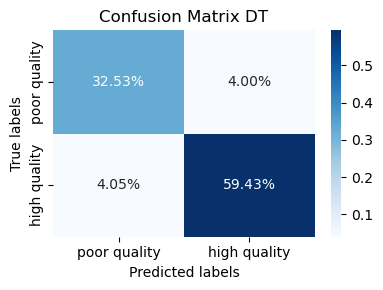

In [ ]:
models.show_confusion_matrix(dt, X_test, y_test, ' DT test set')

In [ ]:
models.show_confusion_matrix(dt, X_train, y_train, ' DT train set')

In [102]:
dt_feature_scores = pd.Series(dt.feature_importances_, index=X_train.columns).sort_values(ascending=False)

In [103]:
dt_most_important = dt_feature_scores.index[:15].values
dt_most_important

array(['env-shape-factor', 'dist-from-interrogator', 'psd-skew',
       'env-psd-entropy', 'mfcc10_max', 'env_freq-skew',
       '3-peak-prominence-factor', 'gentle-dist-from-signal-max',
       'mfcc0_mean', 'psd-entropy', 'env_psd-kurtosis', 'env_freq-avg',
       'env-margin-factor', 'env_freq-kurtosis', 'env_psd-peak'],
      dtype=object)

### train RF

In [ ]:
%%time
score_rf = models.run_RF_grid_search(X_train, y_train, verbose=2)

In [ ]:
score_rf.to_csv('score_rf.csv', sep=',', index=False)

In [96]:
score_rf.nlargest(5,"mean_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_max_features,param_min_samples_leaf,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
725,2669.355813,48.498117,0.537858,0.020793,20,None,5,500,"{'max_depth': 20, 'max_features': None, 'min_s...",0.958066,0.961567,0.963421,0.956329,0.959846,0.002796,1
724,536.271084,7.072041,0.126628,0.012569,20,None,5,100,"{'max_depth': 20, 'max_features': None, 'min_s...",0.958488,0.961586,0.962963,0.955922,0.959740,0.002736,2
665,1034.086993,3.835663,0.561692,0.009826,20,50,5,500,"{'max_depth': 20, 'max_features': 50, 'min_sam...",0.957358,0.961139,0.965321,0.954198,0.959504,0.004161,3
664,208.499303,1.797146,0.121455,0.001185,20,50,5,100,"{'max_depth': 20, 'max_features': 50, 'min_sam...",0.957206,0.959743,0.963366,0.954982,0.958824,0.003117,4
670,190.799061,1.785611,0.158478,0.063833,20,50,10,100,"{'max_depth': 20, 'max_features': 50, 'min_sam...",0.956952,0.959436,0.964100,0.953907,0.958599,0.003731,5


In [109]:
%%time
rf = models.fit_RF_model(X_train,y_train)

CPU times: user 31min 56s, sys: 690 ms, total: 31min 56s
Wall time: 31min 57s


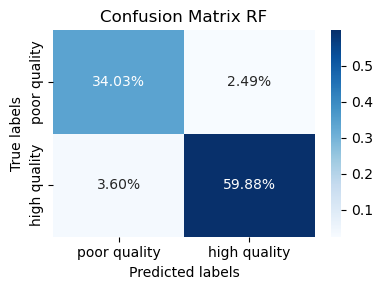

In [110]:
models.show_confusion_matrix(rf, X_test, y_test, ' RF')

In [118]:
%%time
smaller_rf = models.fit_RF_model(X_train,y_train,max_features=50)

CPU times: user 12min 22s, sys: 331 ms, total: 12min 22s
Wall time: 12min 22s


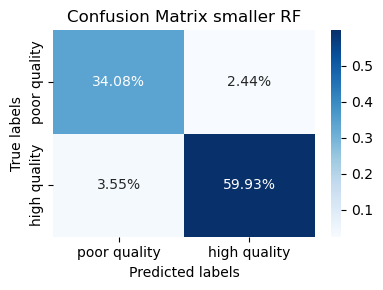

In [119]:
models.show_confusion_matrix(smaller_rf, X_test, y_test, ' smaller RF')

In [ ]:
models.save_model(dt, 'dt.pkl')
models.save_model(rf, 'rf.pkl')
models.save_model(smaller_rf, 'smaller_rf.pkl')

In [113]:
feature_scores = pd.Series(rf.feature_importances_, index=X_train.columns).sort_values(ascending=False)

rf_most_important = feature_scores.index[:15].values
rf_most_important

array(['env-waveform-factor', 'env-shape-factor',
       'dist-from-interrogator', 'psd-skew', 'env-margin-factor',
       'env-clearance-factor', 'env-psd-entropy', 'env_freq-avg',
       'env_freq-kurtosis', 'psd-entropy', 'freq-skew',
       'gentle-dist-from-signal-max', 'mfcc10_max', 'mfcc12_mean',
       'env_freq-skew'], dtype=object)

In [122]:
feature_scores = pd.Series(smaller_rf.feature_importances_, index=X_train.columns).sort_values(ascending=False)

smaller_rf_most_important = feature_scores.index[:15].values
smaller_rf_most_important

array(['env-waveform-factor', 'env-shape-factor', 'env-margin-factor',
       'env-clearance-factor', 'dist-from-interrogator', 'psd-skew',
       'env-impulse-factor', 'psd-entropy', 'env-crest-factor',
       'env-psd-entropy', 'env_freq-avg', 'freq-skew', 'psd-kurtosis',
       'env_freq-kurtosis', 'env_psd-skew'], dtype=object)

Feature ranking: [ 49  42  93  78  30  83  92  33  82  85  96  74  52  39   8  21 109  80
   1  34   1   1  27 114  45  87   5   2  69 100  94  90 108 107  99  86
  11   1  73   1  79   9   1  37  72   4  16  44 104  54  41  48  61  35
  15  25  17  36 106  70 112  98  60  43  29   1  13  47  18  66  32 105
  76  59  75 116  40  24  91 110  56 102  19  62  71 117 113  26  89  81
  77  67  68  84  64  38  63   1  65   1 111   6  51  53  14 101   1  22
   1  28   1  57  10  58 115   7  55   1 103  46  23  88   1  50  97   1
   3  31  95  20  12]
Selected features: Index(['dist-from-interrogator', 'gentle-dist-from-signal-max',
       '3-peak-prominence-factor', 'env-waveform-factor',
       'env-clearance-factor', 'mfcc0_mean', 'mfcc10_max', 'psd-skew',
       'psd-entropy', 'env_psd-skew', 'env-psd-entropy', 'env_psd-peak',
       'freq-entropy', 'env_freq-avg', 'env_freq-skew'],
      dtype='object')
Model accuracy with selected features: 0.924759247592476
CPU times: user 6min, sys: 19

/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/sklearn/base.py:458: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


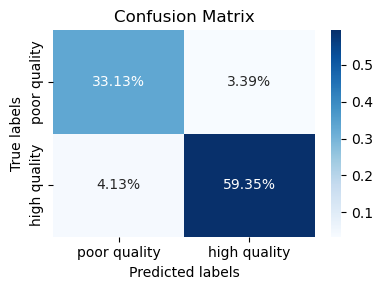

In [115]:
%%time
rfe, new_dt = models.fit_train_RFE(dt, X_train, X_test, y_train, y_test, n_features=15)

Fitting estimator with 131 features.
Fitting estimator with 130 features.
Fitting estimator with 129 features.
Fitting estimator with 128 features.
Fitting estimator with 127 features.
Fitting estimator with 126 features.
Fitting estimator with 125 features.
Fitting estimator with 124 features.
Fitting estimator with 123 features.
Fitting estimator with 122 features.
Fitting estimator with 121 features.
Fitting estimator with 120 features.
Fitting estimator with 119 features.
Fitting estimator with 118 features.
Fitting estimator with 117 features.
Fitting estimator with 116 features.
Fitting estimator with 115 features.
Fitting estimator with 114 features.
Fitting estimator with 113 features.
Fitting estimator with 112 features.
Fitting estimator with 111 features.
Fitting estimator with 110 features.
Fitting estimator with 109 features.
Fitting estimator with 108 features.
Fitting estimator with 107 features.
Fitting estimator with 106 features.
Fitting estimator with 105 features.
F

/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/sklearn/base.py:458: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


Model accuracy with selected features: 0.9382593825938259
CPU times: user 17h 30min 15s, sys: 851 ms, total: 17h 30min 16s
Wall time: 17h 30min 19s


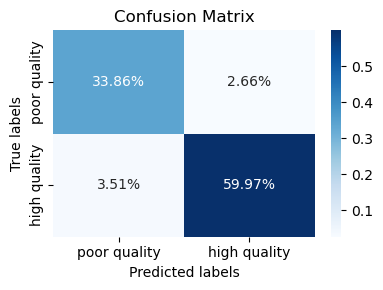

In [125]:
%%time
rfe_rf, new_smaller_rf = models.fit_train_RFE(smaller_rf, X_train, X_test, y_train, y_test, n_features=20, verbose=10)

In [117]:
%%time
models.save_model(rfe, 'rfe_of_dt.pkl')
models.save_model(new_dt, 'rfe_dt.pkl')

CPU times: user 676 µs, sys: 999 µs, total: 1.67 ms
Wall time: 1.33 ms


In [126]:
models.save_model(rfe_rf, 'rfe_of_rf.pkl')
models.save_model(new_smaller_rf, 'rfe_smaller_rf.pkl')

In [155]:
rf_selected_features = ['dist-from-interrogator', 'dist-from-signal-max',
       'gentle-dist-from-signal-max', '1-peak-prominence-factor', 'env-skew',
       'env-margin-factor', 'env-impulse-factor', 'env-waveform-factor',
       'env-shape-factor', 'env-clearance-factor', 'mfcc1_mean',
       'env_mfcc1_mean', 'env_mfcc1_max', 'psd-skew', 'env_psd-skew',
       'env-psd-entropy', 'env_freq-skew', 'env_freq-kurtosis',
       'env_freq-peak', 'lags']

In [92]:
dt_selected_features = ['dist-from-interrogator', 'dist-from-signal-max',
                        'gentle-dist-from-signal-max', '3-peak-prominence-factor',
                        'envelope-median', 'envelope-skew', 'envelope-impulse-factor',
                        'envelope-waveform-factor', 'mfcc1_mean', 'psd-variance', 'psd-skew',
                        'freq-peak', 'beta', 'mad_pcc', 'lags']

#### Now all on Emanuele's event(s)

#### Now use same training to predict on other 5 Emanuele events, leaving performance improvements till later.
- CANDAS2_2023-04-16_12-22-36
- CANDAS2_2023-04-11_11-09-04
- CANDAS2_2023-02-22_07-01-14
- CANDAS2_2023-01-07_10-48-10
- CANDAS2_2022-11-17_04-38-20

In reverse chronological order:

In [13]:
candas2_416_df = utl.import_h5('data/eventos_emanuele/CANDAS2_2023-04-16_12-22-36_filtered_2pn.h5')

In [14]:
candas2_416_df

,0,1,2,3,4,5,6,7,8,9,...,6485,6486,6487,6488,6489,6490,6491,6492,6493,6494
0,-0.033182,0.076790,-0.036304,0.015882,0.005513,0.001697,0.001644,0.003767,-0.001674,0.002627,...,-0.025183,0.030801,0.013545,-0.065365,-0.047910,-0.035655,-0.040157,-0.155054,0.037023,-0.071686
1,-0.045931,0.093364,-0.049626,0.023907,0.012227,0.004010,0.003782,0.006791,-0.001678,0.001550,...,-0.024311,0.030862,0.012105,-0.102131,-0.063887,-0.049624,-0.046251,-0.212627,0.051694,-0.075555
2,-0.024145,0.035465,-0.026453,0.013852,0.005831,0.000304,0.002641,0.003350,-0.000619,-0.003137,...,-0.003424,0.010741,-0.006937,-0.059712,-0.039851,-0.027911,-0.021256,-0.086866,0.030224,-0.020416
3,-0.019235,0.019861,-0.020629,0.010142,-0.000485,-0.000268,-0.001571,0.001670,-0.000601,0.000410,...,-0.008331,0.004019,-0.000942,-0.044212,-0.021792,-0.023027,-0.003939,-0.052497,0.009491,-0.015631
4,-0.007902,0.005654,-0.009921,0.003646,0.000705,0.002194,-0.002094,0.000942,0.000949,0.003869,...,-0.008614,-0.005287,0.015595,-0.030092,0.002554,-0.000683,0.033054,-0.038684,-0.014570,-0.017070
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,0.002768,-0.004355,-0.005525,-0.006571,0.001048,-0.000685,-0.000242,0.002358,0.002717,0.001412,...,0.002483,-0.004283,0.010177,0.001944,-0.014031,0.010649,0.009034,0.001487,-0.000836,0.009967
7996,0.002638,-0.000682,-0.002260,-0.003322,0.000472,-0.001363,-0.000395,0.002672,-0.001011,0.004387,...,0.015147,0.013047,-0.005563,0.006461,0.001127,0.009602,0.001658,-0.004126,-0.005261,0.007096
7997,-0.000507,0.000151,0.000547,0.001006,-0.000509,-0.000176,-0.000326,0.000212,-0.001326,0.000755,...,0.003680,0.005051,-0.004694,0.000774,0.004759,-0.001177,-0.001053,-0.002586,-0.003134,-0.001357
7998,-0.000673,0.000280,0.001016,0.001223,-0.000783,-0.000041,-0.000355,-0.001457,-0.000252,-0.001725,...,-0.004018,-0.003668,-0.000507,-0.002432,0.000314,-0.001423,-0.000676,0.000876,0.002035,-0.004719


In [15]:
candas2_416_df.shape

(8000, 6495)

In [16]:
candas2_416_df = utl.filter_imported_data(candas2_416_df, pass_low=3, pass_hi=12.5, decimate_data=True)

In [17]:
candas2_416_df.shape

(8000, 6495)

In [20]:
candas2_416_df = utl.set_data_limits(candas2_416_df, first_ch=415, first_time=3000, last_time=5500)

In [ ]:
%%time
df_features416 = feat.create_feature_df(candas2_416_df)
df_features416.to_csv('candas0416_features.csv', sep=',', index=False)

created normal features
created mfccs


/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=49
  warnings.warn(


created envelope mfccs
created psd
created psd of envelope
CPU times: user 9min 44s, sys: 18.1 s, total: 10min 2s
Wall time: 7min 21s


In [21]:
df_features416 = pd.read_csv('candas0416_features.csv', sep=',')
df_features416.drop('Unnamed: 0', axis=1, inplace=True)
df_features416

,mean,median,variance,skew,kurtosis,rms,peak,crest-factor,Average-rectified-value,stdev,...,two_kurtoses,env_freq-avg,env_freq-median,env_freq-variance,env_freq-skew,env_freq-kurtosis,env-freq-entropy,env_freq-rms,env_freq-peak,env_freq-crest-factor
0,0.000369,0.004881,0.151602,0.078080,0.750805,0.389283,2.048972,5.263445,0.303572,0.389361,...,35.014486,0.013018,0.256590,7.047749,6.759306,46.635901,2.422463,2.735883,18.756354,6.855685
1,0.000236,0.007414,0.154393,-0.079008,0.593779,0.392851,1.558929,3.968248,0.305309,0.392929,...,27.708608,0.013949,0.221924,7.144270,6.758853,46.664859,2.362677,2.751822,18.877233,6.859902
2,-0.000025,0.006167,0.106927,0.000795,0.057483,0.326931,1.232720,3.770577,0.259978,0.326997,...,2.747039,0.012183,0.274743,4.959050,6.874020,47.788431,2.370305,2.287020,15.791053,6.904642
3,-0.000018,0.000533,0.069811,0.011446,0.260154,0.264164,1.087701,4.117522,0.207231,0.264217,...,12.355595,0.011694,0.182148,3.236594,6.843680,47.493373,2.385389,1.849878,12.747781,6.891149
4,0.000167,0.001133,0.085484,-0.007378,0.050954,0.292319,0.990996,3.390122,0.232569,0.292377,...,2.456289,0.008667,0.176982,4.059703,6.917040,48.205712,2.176408,2.056734,14.266628,6.936543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6075,0.002299,0.043988,17.940361,-0.097876,0.355495,4.234760,17.640589,4.165664,3.318669,4.235606,...,17.192991,0.211460,3.180853,833.350402,6.933274,48.363512,2.323600,29.561392,204.928715,6.932309
6076,-0.003669,-0.030121,7.793947,0.048294,0.471649,2.791208,11.849472,4.245284,2.177706,2.791764,...,22.644423,0.099498,2.446642,363.094929,6.896672,48.011181,2.376257,19.563965,135.241512,6.912787
6077,0.001433,0.060511,32.148850,-0.009377,0.702001,5.668862,23.915064,4.218671,4.401503,5.669996,...,33.596918,0.225705,3.844347,1489.942015,6.881085,47.858792,2.448557,39.727343,274.120011,6.900034
6078,-0.000131,0.027876,7.623732,0.099104,0.803968,2.760559,14.344558,5.196252,2.173209,2.761111,...,37.259120,0.092828,2.258441,351.587010,6.727744,46.344037,2.489463,19.394066,132.537674,6.833929


In [22]:
candas2_411_df = utl.import_h5('data/eventos_emanuele/CANDAS2_2023-04-11_11-09-04_filtered_2pn.h5')

In [23]:
candas2_411_df = utl.filter_imported_data(candas2_411_df, pass_low=3, pass_hi=12.5, decimate_data=True)

In [24]:
candas2_411_df.shape

(8000, 6495)

In [27]:
candas2_411_df = utl.set_data_limits(candas2_411_df, first_ch=415, first_time=3000, last_time=5500)

In [ ]:
%%time
df_features411 = feat.create_feature_df(candas2_411_df)
df_features411.to_csv('candas0411_features.csv', sep=',', index=False)

created normal features
created mfccs


/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=49
  warnings.warn(


created envelope mfccs
created psd
created psd of envelope
CPU times: user 8min 54s, sys: 17.7 s, total: 9min 12s
Wall time: 6min 29s


In [28]:
df_features411 = pd.read_csv('candas0411_features.csv', sep=',')
df_features411.drop('Unnamed: 0', axis=1, inplace=True)
df_features411

,mean,median,variance,skew,kurtosis,rms,peak,crest-factor,Average-rectified-value,stdev,...,two_kurtoses,env_freq-avg,env_freq-median,env_freq-variance,env_freq-skew,env_freq-kurtosis,env-freq-entropy,env_freq-rms,env_freq-peak,env_freq-crest-factor
0,0.000135,0.008406,1.502486,-0.227946,10.699684,1.225514,10.699001,8.730213,0.738589,1.225759,...,209.660743,0.012591,2.125999,57.696817,4.031160,19.595040,3.054788,8.660546,46.145793,5.328278
1,-0.000120,0.005263,1.459171,-0.178820,10.174740,1.207720,9.936718,8.227666,0.731320,1.207962,...,201.141710,0.010445,2.222881,55.940879,4.073770,19.768731,3.078902,8.537195,45.478820,5.327139
2,0.000125,0.000829,0.724629,-0.204670,9.855149,0.851081,6.689560,7.860073,0.535358,0.851251,...,227.801817,0.009621,1.716000,28.242443,4.408754,23.115004,3.055550,6.014847,33.383255,5.550142
3,0.000219,0.002667,0.675621,0.014677,5.639806,0.821798,5.053313,6.149097,0.534506,0.821962,...,135.277093,0.011108,1.289995,27.085514,4.516891,23.986124,2.982088,5.804177,32.772091,5.646294
4,-0.000101,-0.001153,0.773880,0.146408,8.206869,0.879529,6.601582,7.505816,0.561903,0.879705,...,189.525035,0.010267,1.538282,30.406647,4.434012,23.093463,3.042576,6.211785,34.542005,5.560721
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6075,0.005579,0.065298,32.149168,-0.012000,2.338663,5.668893,27.469633,4.845679,3.907083,5.670024,...,65.018111,0.076066,8.825062,1287.138880,4.919256,27.801407,3.004246,39.679992,232.714076,5.864771
6076,0.005990,-0.078956,19.958648,0.033356,1.383603,4.466621,21.237068,4.754616,3.353456,4.467510,...,52.651870,0.095937,3.442508,900.743735,5.954182,38.054187,2.539336,31.355310,203.868067,6.501867
6077,0.004403,-0.023335,31.403722,0.010406,1.432308,5.602784,28.887225,5.155870,4.127493,5.603902,...,53.254808,0.129833,4.591551,1405.773485,5.874519,37.181118,2.584781,39.317815,253.777181,6.454509
6078,0.004124,-0.003308,33.098165,0.018048,2.461444,5.751952,28.669598,4.984325,4.042174,5.753100,...,72.988874,0.091816,5.905038,1421.397229,5.152118,29.652866,2.770185,40.436027,244.761479,6.053055


In [29]:
candas2_222_df = utl.import_h5('data/eventos_emanuele/CANDAS2_2023-02-22_07-01-14_filtered_2pn.h5')

In [30]:
candas2_222_df = utl.filter_imported_data(candas2_222_df, pass_low=3, pass_hi=12.5, decimate_data=True)

In [31]:
candas2_222_df.shape

(8000, 6495)

In [34]:
candas2_222_df = utl.set_data_limits(candas2_222_df, first_ch=415, first_time=3000, last_time=5500)

In [ ]:
%%time
df_features222 = feat.create_feature_df(candas2_222_df)
df_features222.to_csv('candas0222_features.csv', sep=',', index=False)

created normal features
created mfccs


/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=49
  warnings.warn(


created envelope mfccs
created psd
created psd of envelope
CPU times: user 8min 9s, sys: 16.1 s, total: 8min 25s
Wall time: 6min 1s


In [35]:
df_features222 = pd.read_csv('candas0222_features.csv', sep=',')
df_features222.drop('Unnamed: 0', axis=1, inplace=True)
df_features222

,mean,median,variance,skew,kurtosis,rms,peak,crest-factor,Average-rectified-value,stdev,...,two_kurtoses,env_freq-avg,env_freq-median,env_freq-variance,env_freq-skew,env_freq-kurtosis,env-freq-entropy,env_freq-rms,env_freq-peak,env_freq-crest-factor
0,0.000272,0.006019,0.130784,-0.051509,0.160575,0.361569,1.274251,3.524226,0.284929,0.361641,...,7.635627,0.014783,0.180000,6.093834,6.849485,47.551786,2.308915,2.532491,17.474922,6.900289
1,0.000036,0.010848,0.118610,-0.056060,0.361351,0.344329,1.611348,4.679678,0.271317,0.344398,...,17.394929,0.013050,0.304668,5.529179,6.909965,48.138658,2.369796,2.412698,16.693234,6.918906
2,0.000125,0.001527,0.063208,0.017793,0.212095,0.251362,0.991455,3.944335,0.200200,0.251412,...,10.285541,0.011921,0.138725,2.955911,6.947322,48.494980,2.132390,1.751379,12.175090,6.951717
3,-0.000590,0.001325,0.071035,-0.041891,0.029415,0.266472,1.026375,3.851720,0.213279,0.266524,...,1.428922,0.012498,0.097142,3.350524,6.955935,48.578302,1.904609,1.856758,12.932858,6.965290
4,-0.000480,0.007072,0.080858,-0.066118,0.289061,0.284299,1.118821,3.935363,0.224959,0.284356,...,13.889100,0.009308,0.133450,3.834472,6.901457,48.049029,2.157168,1.998304,13.852716,6.932236
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6075,-0.002014,-0.005618,5.111674,-0.007139,0.266433,2.260450,8.839913,3.910687,1.779954,2.260901,...,12.694668,0.090818,1.866649,236.884814,6.859522,47.646805,2.397579,15.825266,109.135427,6.896278
6076,0.001293,-0.083145,10.787495,0.074835,0.542643,3.283776,14.506068,4.417496,2.543763,3.284432,...,25.750696,0.102203,2.062935,503.835623,6.840169,47.454170,2.418171,23.098851,159.088654,6.887297
6077,-0.002597,-0.025107,5.300295,0.086786,0.252984,2.301778,10.926233,4.746866,1.814051,2.302237,...,11.841524,0.082265,2.019020,242.838270,6.772006,46.807406,2.562390,16.158569,110.533531,6.840552
6078,-0.001254,-0.004924,14.984085,0.021827,0.221783,3.870154,13.802334,3.566352,3.062503,3.870928,...,10.776419,0.124804,2.894125,703.420330,6.956928,48.589965,2.338434,27.148280,188.432550,6.940865


In [36]:
candas2_107_df = utl.import_h5('data/eventos_emanuele/CANDAS2_2023-01-07_10-48-10_filtered_2pn.h5')

In [37]:
candas2_107_df

,0,1,2,3,4,5,6,7,8,9,...,6997,6998,6999,7000,7001,7002,7003,7004,7005,7006
0,-1.087026,0.276845,0.141368,-0.016303,-0.248508,-0.014801,-0.006345,0.005945,-0.029269,-0.010801,...,-0.076514,0.238987,-0.258762,-0.265384,-0.928916,-0.155681,-0.291449,-0.267413,-0.295441,0.619922
1,-1.366850,0.341962,0.153754,-0.002283,-0.307941,-0.017095,-0.004226,0.007827,-0.028923,-0.015035,...,-0.054604,0.285415,-0.229214,-0.230212,-1.030580,-0.225256,-0.424706,-0.295758,-0.441370,0.836622
2,-0.499093,0.122631,0.062844,-0.003350,-0.104835,-0.004524,-0.000275,0.004393,-0.010558,-0.003895,...,-0.018599,0.035124,-0.025052,-0.022862,-0.390409,-0.115552,-0.165634,-0.058212,-0.189792,0.322657
3,-0.369518,0.094269,0.075787,-0.006917,-0.070579,-0.003231,-0.003696,0.003419,-0.011126,0.000271,...,-0.030721,-0.006366,0.049495,-0.008372,-0.341985,-0.081598,-0.036974,-0.076533,-0.118057,0.181575
4,-0.239603,0.061136,0.029212,0.007812,-0.045565,-0.001725,0.000390,0.005528,-0.004808,-0.003775,...,0.009357,0.068266,0.113119,-0.022725,-0.145972,-0.046307,-0.021782,-0.143120,-0.143943,0.129673
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,-0.004586,0.000873,-0.009553,0.009925,0.002836,0.001512,0.004175,0.000942,-0.000876,-0.003367,...,0.026934,-0.073427,0.037225,-0.032056,0.108551,-0.012241,-0.007125,-0.078476,-0.070506,0.021808
7996,0.017164,0.010766,0.009081,0.006020,0.003644,-0.000690,0.002166,0.001254,0.006306,0.007325,...,-0.019682,-0.002393,0.108630,0.020580,0.127117,0.043421,0.031911,-0.025630,0.013371,-0.073606
7997,0.006767,0.002999,0.004799,-0.001525,0.000229,-0.001026,-0.001320,0.000410,0.002153,0.003353,...,-0.012707,0.025121,0.019985,0.017520,0.007469,0.017786,0.015183,0.013910,0.026085,-0.033772
7998,-0.004452,-0.004229,-0.003700,-0.003287,-0.001739,-0.000470,-0.001559,-0.001290,-0.002107,-0.002381,...,0.005249,0.005487,-0.038087,0.000673,-0.045348,-0.016715,-0.013993,0.020107,0.008114,0.019795


In [38]:
candas2_107_df = utl.filter_imported_data(candas2_107_df, pass_low=3, pass_hi=12.5, decimate_data=True)

In [39]:
candas2_107_df.shape

(8000, 7007)

In [42]:
candas2_107_df = utl.set_data_limits(candas2_107_df, first_ch=415, first_time=3000, last_time=6000)

In [ ]:
%%time
df_features107 = feat.create_feature_df(candas2_107_df)
df_features107.to_csv('candas0107_features.csv', sep=',', index=False)

created normal features
created mfccs


/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=59
  warnings.warn(


created envelope mfccs
created psd
created psd of envelope
CPU times: user 9min 12s, sys: 17.8 s, total: 9min 29s
Wall time: 6min 51s


In [43]:
df_features107 = pd.read_csv('candas0107_features.csv', sep=',')
df_features107.drop('Unnamed: 0', axis=1, inplace=True)
df_features107

,mean,median,variance,skew,kurtosis,rms,peak,crest-factor,Average-rectified-value,stdev,...,two_kurtoses,env_freq-avg,env_freq-median,env_freq-variance,env_freq-skew,env_freq-kurtosis,env-freq-entropy,env_freq-rms,env_freq-peak,env_freq-crest-factor
0,-0.000650,0.022732,8.285924,-0.272766,14.154228,2.878048,23.188277,8.056945,1.531692,2.878528,...,209.390905,0.016503,4.427939,380.517480,3.583075,14.793524,3.230386,22.289455,114.794337,5.150164
1,-0.001322,0.000225,17.351192,-0.058055,12.272503,4.164782,32.854647,7.888683,2.158134,4.165476,...,163.115702,0.017104,6.389327,805.040450,3.450605,13.291152,3.192716,32.261690,161.096746,4.993438
2,-0.000763,-0.002937,11.815759,0.000628,10.737005,3.436833,24.570042,7.149035,1.858143,3.437406,...,163.808099,0.021334,5.366190,551.473245,3.660714,15.256405,3.197170,26.617564,138.279243,5.195037
3,-0.001302,-0.003696,3.775135,0.079340,8.777991,1.942647,12.913964,6.647611,1.131729,1.942971,...,172.454036,0.019361,3.155725,182.113214,4.112062,19.646186,3.126504,15.037513,84.239936,5.601986
4,-0.000718,-0.021688,3.935759,0.251639,9.342588,1.983544,13.570121,6.841350,1.153130,1.983875,...,174.655686,0.016873,2.142588,192.461004,4.007987,18.694573,3.057267,15.360313,85.402973,5.559976
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6587,-0.005688,-0.183281,303.591298,0.142987,0.157891,17.420969,70.733224,4.060235,13.770350,17.423871,...,9.167917,0.667952,11.959673,17152.631885,7.591860,58.064747,2.438340,133.744333,1017.216107,7.605676
6588,0.001950,-0.106711,169.267484,0.044564,0.090413,13.008116,46.534273,3.577326,10.270155,13.010284,...,5.265423,0.342536,7.789524,9688.339792,7.608772,58.237561,2.244172,100.064917,763.054987,7.625600
6589,0.013031,0.024428,329.918811,-0.027016,-0.080454,18.160645,59.180451,3.258720,14.480476,18.163667,...,-4.705251,0.718790,11.128264,18684.370435,7.631879,58.483998,2.315485,139.070611,1061.188132,7.630571
6590,-0.005250,-0.032336,245.770085,0.016023,0.011626,15.674445,54.118463,3.452656,12.427791,15.677056,...,0.676565,0.577154,12.031359,13859.130368,7.604150,58.195293,2.396838,120.100902,914.325858,7.612981


In [ ]:
%%time
df_features1227 = feat.create_feature_df(candas2_df)
df_features1227.to_csv('candas1227_features.csv', sep=',', index=False)

created normal features
created mfccs


/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=59
  warnings.warn(


created envelope mfccs
created psd
created psd of envelope
CPU times: user 11min 35s, sys: 23.5 s, total: 11min 59s
Wall time: 8min 51s


In [44]:
df_features1227 = pd.read_csv('candas1227_features.csv', sep=',')
df_features1227.drop('Unnamed: 0', axis=1, inplace=True)
df_features1227

,mean,median,variance,skew,kurtosis,rms,peak,crest-factor,Average-rectified-value,stdev,...,two_kurtoses,env_freq-avg,env_freq-median,env_freq-variance,env_freq-skew,env_freq-kurtosis,env-freq-entropy,env_freq-rms,env_freq-peak,env_freq-crest-factor
0,-0.000325,-0.015743,0.385877,0.008897,0.047363,0.621087,2.582363,4.157816,0.497405,0.621190,...,2.750998,0.020737,0.437990,21.943525,7.593603,58.082754,2.391647,4.779130,36.366596,7.609460
1,0.000173,0.002769,0.506836,-0.059633,0.307178,0.711805,2.872586,4.035634,0.556213,0.711924,...,17.620660,0.025646,0.437014,28.544891,7.525119,57.363084,2.449367,5.467672,41.428750,7.577037
2,-0.000160,0.014014,0.416945,-0.118725,-0.020638,0.645605,2.237091,3.465109,0.516310,0.645713,...,-1.193694,0.019167,0.361888,23.686117,7.570557,57.840422,2.431305,4.972134,37.775509,7.597444
3,-0.000498,0.006222,0.537291,-0.016509,0.104375,0.732879,2.847307,3.885098,0.579546,0.733001,...,6.067824,0.022657,0.441115,30.398358,7.599246,58.135077,2.332877,5.615282,42.770148,7.616741
4,0.000124,0.002962,0.396505,-0.008710,0.099913,0.629581,2.162681,3.435108,0.495742,0.629686,...,5.852332,0.022524,0.337395,22.691557,7.640362,58.574284,2.241522,4.839565,36.963352,7.637743
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6587,-0.020305,-0.076535,324.558735,0.065751,-0.099263,18.012523,64.611912,3.587055,14.398545,18.015514,...,-5.802439,0.622762,9.198140,18573.518420,7.629012,58.455045,2.218989,138.451520,1056.983280,7.634321
6588,-0.019450,0.295360,336.443464,-0.080467,-0.163613,18.339349,64.655750,3.525520,14.781580,18.342395,...,-9.580200,0.667219,11.255506,19038.874259,7.638493,58.554051,2.263206,140.236343,1070.839562,7.635963
6589,-0.034105,0.146613,258.473930,0.006140,-0.038591,16.074482,61.804206,3.844865,12.787961,16.077124,...,-2.260417,0.438235,9.035629,14758.580360,7.640548,58.573461,2.239256,123.388009,942.509851,7.638585
6590,0.002876,-0.042424,238.421170,0.085127,0.140793,15.438320,59.870178,3.878024,12.228806,15.440893,...,8.150487,0.462451,10.709449,13297.496272,7.574931,57.889888,2.513323,118.046625,896.194888,7.591872


In [45]:
candas2_1117_df = utl.import_h5('data/eventos_emanuele/CANDAS2_2022-11-17_04-38-20_filtered_2pn.h5')

In [46]:
candas2_1117_df = utl.filter_imported_data(candas2_1117_df, pass_low=3, pass_hi=12.5, decimate_data=True)

In [47]:
candas2_1117_df.shape

(8000, 7007)

In [50]:
candas2_1117_df = utl.set_data_limits(candas2_1117_df, first_ch=415, first_time=3000, last_time=6000)

In [ ]:
%%time
df_features1117 = feat.create_feature_df(candas2_1117_df)
df_features1117.to_csv('candas1117_features.csv', sep=',', index=False)

created normal features
created mfccs


/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=59
  warnings.warn(


created envelope mfccs
created psd
created psd of envelope
CPU times: user 9min 16s, sys: 17.5 s, total: 9min 33s
Wall time: 6min 55s


In [51]:
df_features1117 = pd.read_csv('candas1117_features.csv', sep=',')
df_features1117.drop('Unnamed: 0', axis=1, inplace=True)
df_features1117

,mean,median,variance,skew,kurtosis,rms,peak,crest-factor,Average-rectified-value,stdev,...,two_kurtoses,env_freq-avg,env_freq-median,env_freq-variance,env_freq-skew,env_freq-kurtosis,env-freq-entropy,env_freq-rms,env_freq-peak,env_freq-crest-factor
0,0.001101,0.009889,1.275533,-0.379135,11.513941,1.129207,10.166484,9.003205,0.730751,1.129395,...,361.417808,0.016584,1.777977,60.828047,5.143418,31.389584,3.251351,8.730151,54.700569,6.265707
1,0.000795,0.011040,2.530206,-0.289828,7.968484,1.590397,11.317197,7.115957,1.039022,1.590662,...,240.449924,0.029008,1.875747,126.017787,5.046972,30.175114,3.074633,12.295393,77.402204,6.295220
2,0.001171,-0.006103,1.847292,-0.385899,5.378983,1.358925,9.556197,7.032173,0.944952,1.359151,...,198.468369,0.027236,1.484360,94.614999,5.662199,36.897004,3.001264,10.497741,69.812633,6.650253
3,0.001915,0.011048,1.238192,0.199438,2.428015,1.112557,6.268938,5.634711,0.823416,1.112741,...,119.618072,0.058012,1.469736,63.459275,6.764049,49.265796,3.141433,8.572153,60.968202,7.112356
4,0.000687,0.003600,1.405124,0.065909,3.764063,1.185182,7.806533,6.586781,0.859150,1.185379,...,171.175091,0.039425,1.158488,73.048509,6.423719,45.476151,3.014265,9.153351,64.132153,7.006413
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6587,0.001194,0.069447,327.185660,0.032681,-0.153908,18.085260,63.201709,3.494653,14.552021,18.088274,...,-9.028047,0.612605,9.912863,18826.781887,7.648411,58.658539,2.087893,139.045655,1063.385644,7.647745
6588,0.002120,-0.114143,196.400916,0.071929,-0.179909,14.011976,42.793451,3.054063,11.261636,14.014311,...,-10.518087,0.372972,7.281087,11288.415324,7.629776,58.463397,2.192363,107.893300,823.848980,7.635775
6589,0.009270,-0.209568,268.804796,0.065590,-0.044124,16.392538,70.095574,4.276066,13.188930,16.395267,...,-2.580089,0.493053,9.015121,15357.163936,7.630810,58.473654,2.228718,125.904902,961.236681,7.634625
6590,0.005520,0.112111,349.372459,-0.103518,-0.112065,18.688394,59.493936,3.183470,14.905661,18.691508,...,-6.535757,0.572964,12.383829,19969.406292,7.616209,58.320884,2.235074,143.658717,1095.852288,7.628164


Now predict with DT _and_ RF for all 6 actually

In [10]:
new_dt = models.load_model('rfe_dt.pkl')
new_smaller_rf = models.load_model('rfe_smaller_rf.pkl')

In [179]:
dt_orig = models.load_model('dt.pkl')

In [182]:
y_pred_dt_1117 = dt_orig.predict(df_features1117)
y_pred_dt_1117_new_threshold = (dt_orig.predict_proba(df_features1117)[:, 1] >= 0.9).astype(int) 

pred_bad_channels_dt_1117 = np.where(y_pred_dt_1117 == 0)[0]
pred_bad_channels_dt_1117_new_threshold = np.where(y_pred_dt_1117_new_threshold == 0)[0]

#### Predictions!

In [11]:
smaller_dt_features = ['dist-from-interrogator', 'gentle-dist-from-signal-max',
                       '3-peak-prominence-factor', 'env-waveform-factor',
                       'env-clearance-factor', 'mfcc0_mean', 'mfcc10_max', 'psd-skew',
                       'psd-entropy', 'env_psd-skew', 'env-psd-entropy', 'env_psd-peak',
                       'freq-entropy', 'env_freq-avg', 'env_freq-skew']

In [12]:
smaller_rf_features = ['dist-from-interrogator', 'gentle-dist-from-signal-max', 'env-skew',
                       'env-margin-factor', 'env-waveform-factor', 'env-shape-factor',
                       'env-clearance-factor', 'mfcc0_mean', 'mfcc12_mean', 'mfcc10_max',
                       'psd-skew', 'psd-entropy', 'env_psd-skew', 'env-psd-entropy',
                       'env_psd-peak', 'freq-skew', 'freq-entropy', 'env_freq-avg',
                       'env_freq-skew', 'env_freq-kurtosis']

12/27

In [220]:
y_pred_dt_1227 = dt_orig.predict(df_features1227)
y_pred_dt_1227_new_threshold = (dt_orig.predict_proba(df_features1227)[:, 1] >= 0.9).astype(int) 

pred_bad_channels_dt_1227 = np.where(y_pred_dt_1227 == 0)[0]
pred_bad_channels_dt_1227_new_threshold = np.where(y_pred_dt_1227_new_threshold == 0)[0]

In [54]:
y_pred_smaller_dt_1227 = new_dt.predict(df_features1227[smaller_dt_features])
y_pred_smaller_dt_1227_new_threshold = (new_dt.predict_proba(df_features1227[smaller_dt_features])[:, 1] >= 0.9).astype(int) 

pred_bad_channels_smaller_dt_1227 = np.where(y_pred_smaller_dt_1227 == 0)[0]
pred_bad_channels_smaller_dt_1227_new_threshold = np.where(y_pred_smaller_dt_1227_new_threshold == 0)[0]

/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/sklearn/base.py:458: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/sklearn/base.py:458: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


In [55]:
candas2_1227_df = candas2_df

In [225]:
len(pred_bad_channels_dt_1227), len(pred_bad_channels_smaller_dt_1227)

(5393, 5461)

In [228]:
len(pred_bad_channels_dt_1227_new_threshold), len(pred_bad_channels_smaller_dt_1227_new_threshold)

(5688, 5713)

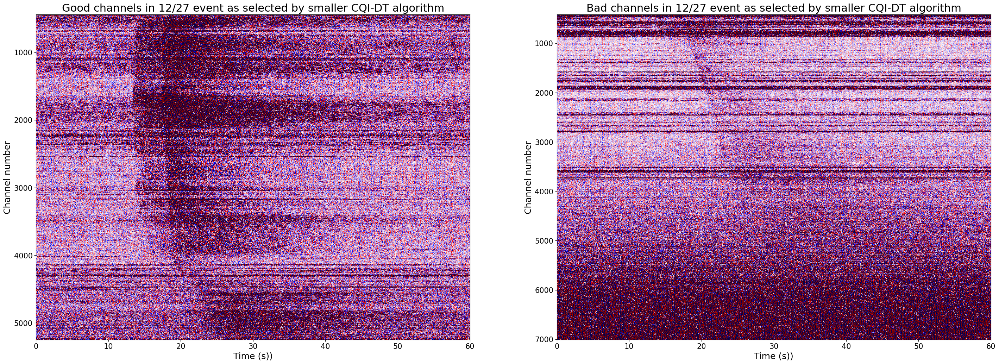

In [230]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(35,12))
masked_df = candas2_1227_df[pred_bad_channels_smaller_dt_1227 + 415]
grph.view_event(masked_df, decimation=True, vmax=1, vmin=-1, title='Bad channels in 12/27 event as selected by smaller CQI-DT algorithm', subplot_ax=ax2)
pred_good_channels_smaller_dt_1227 = set(candas2_1227_df.columns) - set(pred_bad_channels_smaller_dt_1227 + 415)
masked_df = candas2_1227_df[sorted(list(pred_good_channels_smaller_dt_1227))]
grph.view_event(masked_df, decimation=True, vmax=1, vmin=-1, title='Good channels in 12/27 event as selected by smaller CQI-DT algorithm', subplot_ax=ax1)

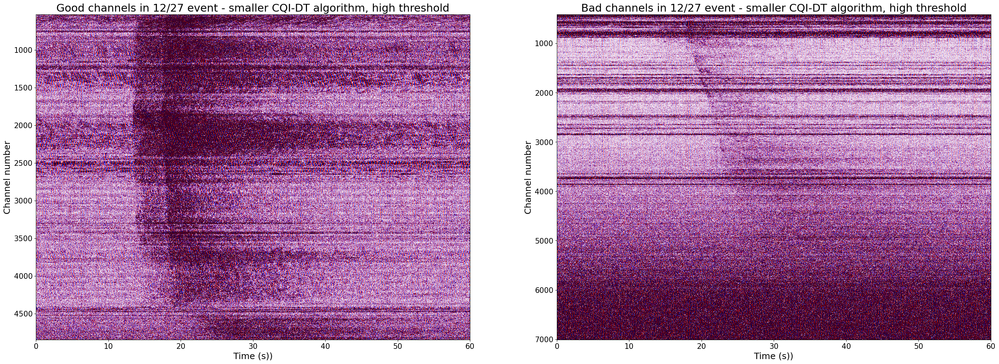

In [232]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(35,12))
masked_df = candas2_1227_df[pred_bad_channels_smaller_dt_1227_new_threshold + 415]
grph.view_event(masked_df, decimation=True, vmax=1, vmin=-1, title='Bad channels in 12/27 event - smaller CQI-DT algorithm, high threshold', subplot_ax=ax2)
pred_good_channels_smaller_dt_1227 = set(candas2_1227_df.columns) - set(pred_bad_channels_smaller_dt_1227_new_threshold + 415)
masked_df = candas2_1227_df[sorted(list(pred_good_channels_smaller_dt_1227))]
grph.view_event(masked_df, decimation=True, vmax=1, vmin=-1, title='Good channels in 12/27 event - smaller CQI-DT algorithm, high threshold', subplot_ax=ax1)

In [233]:
rf_orig = models.load_model('rf.pkl')
y_pred_rf_1227 = rf_orig.predict(df_features1227)
y_pred_rf_1227_new_threshold = (rf_orig.predict_proba(df_features1227)[:, 1] >= 0.9).astype(int) 

pred_bad_channels_rf_1227 = np.where(y_pred_rf_1227 == 0)[0]
pred_bad_channels_rf_1227_new_threshold = np.where(y_pred_rf_1227_new_threshold == 0)[0]

In [56]:
y_pred_smaller_rf_1227 = new_smaller_rf.predict(df_features1227[smaller_rf_features])
y_pred_smaller_rf_1227_new_threshold = (new_smaller_rf.predict_proba(df_features1227[smaller_rf_features])[:, 1] >= 0.9).astype(int) 

pred_bad_channels_smaller_rf_1227 = np.where(y_pred_smaller_rf_1227 == 0)[0]
pred_bad_channels_smaller_rf_1227_new_threshold = np.where(y_pred_smaller_rf_1227_new_threshold == 0)[0]

/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/sklearn/base.py:458: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(
/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/sklearn/base.py:458: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


In [237]:
len(pred_bad_channels_rf_1227), len(pred_bad_channels_smaller_rf_1227)

(5502, 5463)

In [240]:
len(pred_bad_channels_rf_1227_new_threshold), len(pred_bad_channels_smaller_rf_1227_new_threshold)

(5833, 5842)

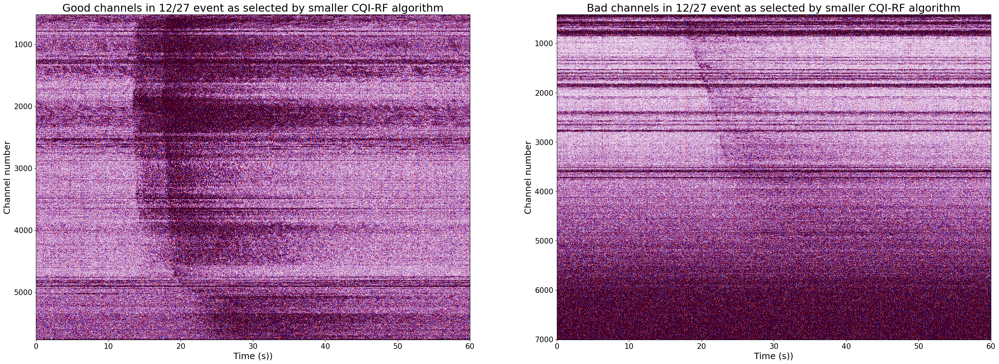

In [242]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(35,12))
masked_df = candas2_1227_df[pred_bad_channels_smaller_rf_1227 + 415]
grph.view_event(masked_df, decimation=True, vmax=1, vmin=-1, title='Bad channels in 12/27 event as selected by smaller CQI-RF algorithm', subplot_ax=ax2)
pred_good_channels_smaller_rf_1227 = set(candas2_1227_df.columns) - set(pred_bad_channels_smaller_rf_1227 + 415)
masked_df = candas2_1227_df[sorted(list(pred_good_channels_smaller_rf_1227))]
grph.view_event(masked_df, decimation=True, vmax=1, vmin=-1, title='Good channels in 12/27 event as selected by smaller CQI-RF algorithm', subplot_ax=ax1)

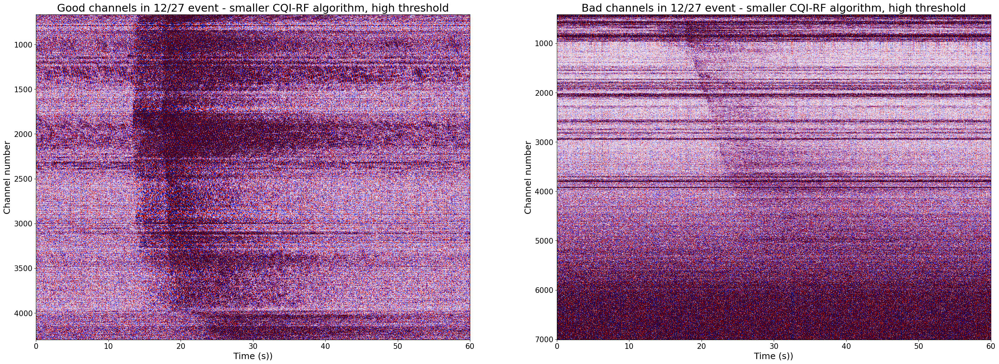

In [244]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(35,12))
masked_df = candas2_1227_df[pred_bad_channels_smaller_rf_1227_new_threshold + 415]
grph.view_event(masked_df, decimation=True, vmax=1, vmin=-1, title='Bad channels in 12/27 event - smaller CQI-RF algorithm, high threshold', subplot_ax=ax2)
pred_good_channels_smaller_rf_1227 = set(candas2_1227_df.columns) - set(pred_bad_channels_smaller_rf_1227_new_threshold + 415)
masked_df = candas2_1227_df[sorted(list(pred_good_channels_smaller_rf_1227))]
grph.view_event(masked_df, decimation=True, vmax=1, vmin=-1, title='Good channels in 12/27 event - smaller CQI-RF algorithm, high threshold', subplot_ax=ax1)

/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/sklearn/base.py:458: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


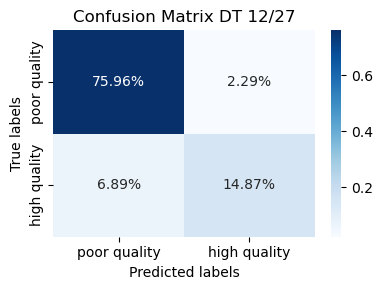

In [250]:
y_pred = new_dt.predict(df_features1227[smaller_dt_features])
y_test = ~df_features1227.index.isin(candas2_bad_channels)*1
models.show_confusion_matrix_given_ytestypred(y_test, y_pred, title = " DT 12/27")

/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/sklearn/base.py:458: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


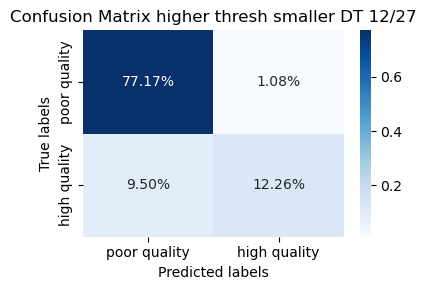

In [253]:
y_pred = (new_dt.predict_proba(df_features1227[smaller_dt_features])[:, 1] >= 0.9).astype(int) 
models.show_confusion_matrix_given_ytestypred(y_test, y_pred, title = " higher thresh smaller DT 12/27")

/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/sklearn/base.py:458: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


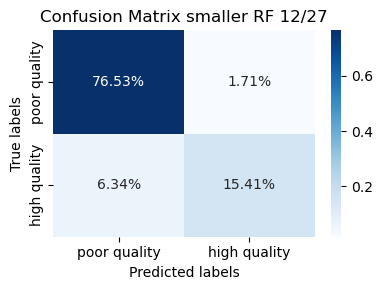

In [259]:
y_pred = new_smaller_rf.predict(df_features1227[smaller_rf_features])
y_test = ~df_features1227.index.isin(candas2_bad_channels)*1
models.show_confusion_matrix_given_ytestypred(y_test, y_pred, title = " smaller RF 12/27")

/home/tatiana/anaconda3/envs/pyobs/lib/python3.11/site-packages/sklearn/base.py:458: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


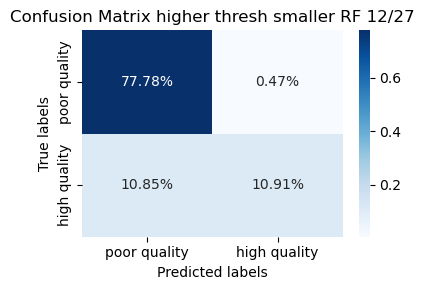

In [262]:
y_pred = (new_smaller_rf.predict_proba(df_features1227[smaller_rf_features])[:, 1] >= 0.9).astype(int) 
models.show_confusion_matrix_given_ytestypred(y_test, y_pred, title = " higher thresh smaller RF 12/27")